In [ ]:
!pip install gdown
!gdown --folder https://drive.google.com/drive/folders/1keVLndBTqTuc6Z10GwLa43-r3IIN_0An?usp=sharing

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14775 sha256=3d3b1204609803b24aad659c69bee226e2599443533adf877a9a1af8b9000f24
  Stored in directory: /root/.cache/pip/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
Retrieving folder list
Processing file 1bi8nzbFTlW-C12qedwPYazdRjtIfuCXC games.csv
Processing file 1jLsqrpYPuH6IUNsNdBKa9eZr4-VqWYxf League of Legends Champion Stats 12.1.csv
Processing file 1yuZtCglO2Qtly0mWjrLIhYl_Alauue3M League of Legends Champion Stats 12.2.csv
Processing file 149U3ba1ZNj1P--X04E4y8hXgSrKV2Tl2 League of Legends Champion Stats 12.3.csv
Processing file 15Z5gA1TfGQsWtsh7bH2O0JnGKiE7Rhqw League of Legends Champion Stats 12.4.csv
Processing file 1cUFVEgIOIfa0covnH5orE5FLL5

In [ ]:
!pip install -r requirements.txt

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.ensemble import GradientBoostingClassifier
#import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.neighbors import NearestNeighbors

# Games.csv

In [ ]:
df = pd.read_csv('/work/lol_data/champ/DataSciData/games.csv')

In [ ]:
df_t1 = df['team_1'].str.split(',', expand=True).rename(columns={0: "TOP_T1", 1: "JG_T1", 2: "MID_T1", 3: "ADC_T1", 4: "SUP_T1"})

In [ ]:
df_t1_merge = pd.merge(df, df_t1, left_index=True, right_index=True)

In [ ]:
df_t2 = df['team_2'].str.split(',', expand=True).rename(columns={0: "TOP_T2", 1: "JG_T2", 2: "MID_T2", 3: "ADC_T2", 4: "SUP_T2"})

In [ ]:
df_merge = pd.merge(df_t1_merge, df_t2, left_index=True, right_index=True).drop(columns=['team_1','team_2','mmr'])

In [ ]:
df_merge.rename(columns={"result": "blue_win"},inplace=True)
df_merge['blue_win'] = df_merge['blue_win'].map({"Victory": 1, "Defeat": 0})
df_merge

,game_length,blue_win,server,timestamp,TOP_T1,JG_T1,MID_T1,ADC_T1,SUP_T1,TOP_T2,JG_T2,MID_T2,ADC_T2,SUP_T2
0,25m 38s,1,na,2020-10-13 09:31:42,Riven,Nidalee,Galio,Jhin,Pantheon,Camille,Olaf,Cassiopeia,Ezreal,Alistar
1,25m 38s,0,na,2020-10-13 06:00:17,Teemo,Nidalee,Lucian,Caitlyn,Senna,Irelia,Hecarim,Cassiopeia,Jinx,Lulu
2,25m 38s,0,na,2020-10-13 05:06:45,Malphite,Olaf,Taliyah,Ezreal,Alistar,Sylas,Lillia,Lucian,Senna,Pantheon
3,25m 38s,0,na,2020-10-13 04:28:00,Neeko,Shen,Orianna,Kai'Sa,Nautilus,Riven,Hecarim,Cassiopeia,Samira,Morgana
4,25m 38s,0,na,2020-10-13 04:00:51,Fiora,Nunu & Willump,Irelia,Jhin,Karma,Renekton,Elise,Kled,Jinx,Morgana
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4023,28m 36s,0,na,2020-10-15 16:49:53,Malphite,Graves,Ziggs,Senna,Pantheon,Renekton,Kha'Zix,Twisted Fate,Yasuo,Thresh
4024,32m 37s,0,na,2020-10-10 05:05:42,Lucian,Graves,Akali,Jinx,Morgana,Samira,Shen,Syndra,Jhin,Braum
4025,28m 36s,1,na,2020-10-15 16:19:54,Shen,Kha'Zix,Orianna,Jhin,Thresh,Qiyana,Lee Sin,Sylas,Caitlyn,Morgana
4026,28m 36s,0,na,2020-10-15 15:25:03,Camille,Fiddlesticks,Qiyana,Senna,Alistar,Ornn,Graves,Zoe,Aphelios,Pyke


# S11.csv

In [ ]:
s11_df = pd.read_csv('/work/lol_data/champ/DataSciData/s11.csv')

In [ ]:
s11_df.rename(columns={"team_1__001": "TOP_T1", "team_1__002": "JG_T1", "team_1__003": "MID_T1", "team_1__004": "ADC_T1", "team_1__005": "SUP_T1"}, inplace=True)
s11_df.rename(columns={"team_2__001": "TOP_T2", "team_2__002": "JG_T2", "team_2__003": "MID_T2", "team_2__004": "ADC_T2", "team_2__005": "SUP_T2"}, inplace=True)

In [ ]:
s11_df.rename(columns={"result": "blue_win"},inplace=True)
s11_df['blue_win'] = s11_df['blue_win'].map({"Victory": 1, "Defeat": 0})
s11_df

,blue_win,server,TOP_T1,JG_T1,MID_T1,ADC_T1,SUP_T1,TOP_T2,JG_T2,MID_T2,ADC_T2,SUP_T2,timestamp,game_length
0,0,eune,Irelia,Elise,Fizz,Draven,Morgana,Kayle,Rek'Sai,Yasuo,Ezreal,Thresh,2020-11-07 05:46:02,18m 0s
1,1,na,Gragas,Taliyah,Yone,Miss Fortune,Leona,Ornn,Kindred,Akali,Seraphine,Thresh,2020-12-31 08:45:22,30m 44s
2,0,na,Volibear,Graves,Lulu,Lucian,Nami,Jax,Taliyah,Katarina,Kai'Sa,Sett,2020-12-31 07:12:07,30m 44s
3,1,na,Gragas,Sejuani,Yone,Samira,Leona,Sylas,Olaf,Anivia,Lucian,Galio,2020-12-31 06:12:52,30m 44s
4,1,na,Katarina,Kindred,Sylas,Yone,Galio,Gragas,Graves,Malphite,Samira,Thresh,2020-12-31 05:12:43,30m 44s
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2896,0,na,Shen,Olaf,Zoe,Miss Fortune,Yuumi,Camille,Ivern,Fizz,Jhin,Maokai,2020-12-13 14:43:05,27m 39s
2897,0,na,Wukong,Kha'Zix,Syndra,Jhin,Bard,Jayce,Graves,Xerath,Viktor,Nami,2020-11-19 10:31:37,16m 7s
2898,0,na,Vladimir,Kindred,Lulu,Xayah,Alistar,Ryze,Taliyah,Lucian,Ezreal,Rell,2020-12-13 11:17:09,27m 39s
2899,0,na,Wukong,Lillia,Fizz,Samira,Leona,Camille,Graves,Sylas,Syndra,Nami,2020-11-19 09:41:48,16m 7s


In [ ]:
!mv /work/lol_data/champ/DataSciData/LOL_data.zip /work/LOL_data.zip

In [ ]:
!unzip /work/LOL_data.zip

Archive:  /work/LOL_data.zip
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Aatrox.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Ahri.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Akali.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Alistar.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Amumu.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Anivia.csv.
checkdir error:  cannot create lol_data
                 Stale file handle
                 unable to process lol_data/champ/Annie.csv.
checkdir error: 

In [ ]:
!pwd

/work/lol_data/champ


In [ ]:
import glob, os

path_dir = "/work/LOL_data/lol_data/champ/"

os.chdir(path_dir)

champ_dict = {}

for file_name in glob.glob("*.csv"):
    champ_name = file_name.split(".")[0]
    temp = pd.read_csv(path_dir+file_name)
    temp = temp[temp['lane'] != 'NONE DUO']
    temp['blue_win'] = temp.apply(lambda x: x['blue_team'] and x['win'], axis=1)
    temp['blue_win'] = temp['blue_win'].astype(int)
    champ_dict[champ_name] = temp
    # print(file_name)

os.chdir('../..')

In [ ]:
champ_dict['Aatrox']['matchId']

0      4620465190
1      4626097218
2      4569023608
3      4564610682
4      4611050665
          ...    
300    4561879884
301    4612764763
302    4623471747
303    4561894677
304    4606817633
Name: matchId, Length: 292, dtype: int64

In [ ]:
match_df = pd.read_csv('./lol_data/match_full_time.csv')

In [ ]:
pos_list = ['TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 
            'TOP_T2', 'JG_T2', 'MID_T2', 'ADC_T2', 'SUP_T2']

for pos in pos_list:
  match_df[pos] = [np.nan] * len(match_df)

In [ ]:
#check lane values
#TOP, JG, MID, ADC, SUP

lane_values = []

for key, value in champ_dict.items():
  lane_values.extend(value['lane'].unique())

lane_values = set(lane_values)


In [ ]:
position_map = {'BOTTOM DUO': 'ADC',
 'BOTTOM DUO_CARRY': 'ADC',
 'BOTTOM DUO_SUPPORT': 'SUP',
 'BOTTOM SOLO': 'ADC',
 'JUNGLE NONE': 'JG',
 'MIDDLE DUO': 'MID',
 'MIDDLE DUO_CARRY': 'MID',
 'MIDDLE DUO_SUPPORT': 'MID',
 'MIDDLE SOLO': 'MID',
 'NONE DUO_CARRY': 'ADC',
 'NONE DUO_SUPPORT': 'SUP',
 'TOP DUO': 'TOP',
 'TOP DUO_CARRY': 'TOP',
 'TOP DUO_SUPPORT': 'TOP',
 'TOP SOLO': 'TOP'}

In [ ]:
for key, value in tqdm(champ_dict.items()):
  
  temp_df = match_df.copy()
  temp_df = temp_df.merge(value[['matchId','lane','blue_team']], how='left', on='matchId')
  temp_df['lane'] = temp_df['lane'].apply(lambda x: x if x is np.nan else position_map[x])

  for index, row in temp_df.iterrows():

    if str(row['lane']) != "nan":
      if row['blue_team']:
        temp_df['lane'][index] = row['lane']+"_T1"
        temp_df[row['lane']+"_T1"][index] = key
      else:
        temp_df['lane'][index] = row['lane']+"_T2"
        temp_df[row['lane']+"_T2"][index] = key

  temp_df.drop(columns=['lane','blue_team'], inplace=True)
  match_df = temp_df.copy()

  0%|          | 0/150 [00:00<?, ?it/s]/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/shared-libs/python3.7/py-core/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [ ]:
match_df = match_df[match_df.iloc[:,21:].isna().sum(axis=1) == 0].reset_index(drop=True)

In [ ]:
tier_plot = match_df.groupby('tier').agg('count')['matchId'].reset_index()

In [ ]:
tier_plot

,tier,matchId
0,BRONZE,446
1,DIAMOND,310
2,GOLD,404
3,PLATINUM,420
4,SILVER,484


<AxesSubplot:xlabel='tier', ylabel='matchId'>

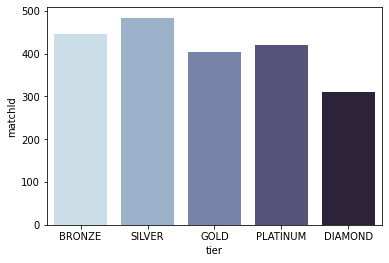

In [ ]:
sns.barplot(data = tier_plot, x = 'tier', y='matchId', order=['BRONZE','SILVER','GOLD','PLATINUM','DIAMOND'], palette='ch:s=.25,rot=-.25')

# Merged

In [ ]:
master_df = df_merge[['blue_win','TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']]

In [ ]:
master_df = master_df.append(s11_df[['blue_win','TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']], ignore_index=True)

In [ ]:
master_df = master_df.append(match_df[['blue_win','TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']], ignore_index=True)

In [ ]:
master_df.to_csv('master_df.csv')

# Model Phase

In [ ]:
# run this
master_df = pd.read_csv('master_df.csv')

In [ ]:
master_df.drop(columns=['Unnamed: 0'], inplace=True)

In [ ]:
for col in master_df.drop(columns=['blue_win']).columns:
    master_df[col] = master_df[col].replace({   'Dr':'Dr. Mundo',
                                                'KaiSa':"Kai'Sa",
                                                "ChoGath":"Cho'Gath",
                                                "KhaZix":"Kha'Zix",
                                                "KogMaw":"Kog'Maw",
                                                'Nunu  Willump':'Nunu & Willump',
                                                "RekSai":"Rek'Sai"})

# EDA

In [ ]:
!pwd

/work/LOL_data


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
heroes_name = ''
stopwords = set(STOPWORDS)
for val in master_df.drop(columns=['blue_win']).columns:
  heroes_name+=" ".join(master_df[val].to_list())

 


In [ ]:
heroes_all = master_df['TOP_T1'].copy()

In [ ]:
for val in master_df.drop(columns=['blue_win','TOP_T1']).columns:
  heroes_all = heroes_all.append(master_df[val], ignore_index=True)

<AxesSubplot:>

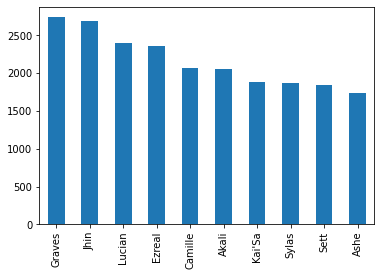

In [ ]:
heroes_all.value_counts()[:10].plot(kind='bar')

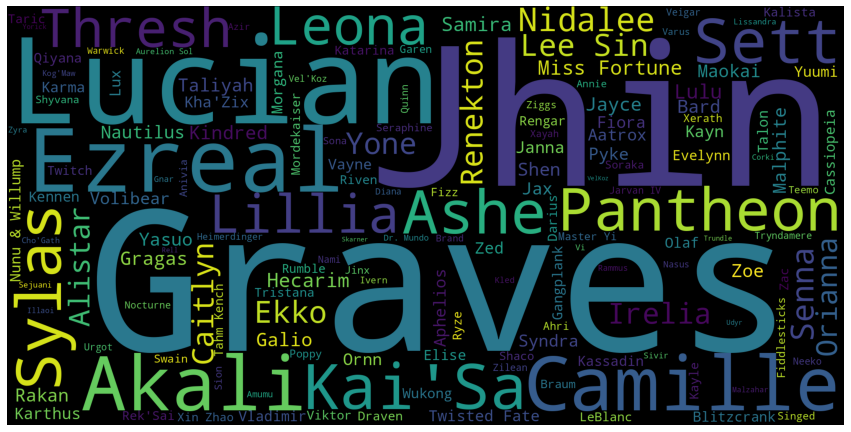

In [ ]:
#convert it to dictionary with values and its occurences
from collections import Counter
word_could_dict=Counter(heroes_all.tolist())
wordcloud = WordCloud(width = 2000, height = 1000).generate_from_frequencies(word_could_dict)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()
plt.savefig('yourfile.png', bbox_inches='tight')
plt.close()

In [ ]:
blue_win_df = master_df[['blue_win','ADC_T1']].copy()

In [ ]:
blue_win_df.groupby('ADC_T1', as_index=False).agg('count').sort_values('blue_win',ascending=False)

,ADC_T1,blue_win
29,Jhin,1398
18,Ezreal,1071
31,Kai'Sa,916
6,Ashe,841
10,Caitlyn,609
...,...,...
57,Pantheon,1
56,Ornn,1
54,Nunu & Willump,1
1,Ahri,1


In [ ]:
blue_win_df['ADC_T1'].unique()

array(['Jhin', 'Caitlyn', 'Ezreal', "Kai'Sa", 'Samira', 'Lucian', 'Senna',
       'Syndra', 'Karthus', 'Aphelios', 'Taliyah', 'Ashe', 'Talon',
       'Kalista', 'Vayne', 'Aurelion Sol', 'Veigar', 'Wukong', "Kog'Maw",
       'Miss Fortune', 'Jinx', 'Twitch', 'Ziggs', 'Draven', 'Pyke',
       'Akali', 'Shen', 'Yasuo', 'Sivir', 'Cassiopeia', 'Tristana',
       'Irelia', 'Sylas', 'Ahri', 'Vladimir', 'Swain', 'Mordekaiser',
       'Xayah', 'Zoe', 'Karma', 'Kindred', 'Volibear', 'Sett',
       'Heimerdinger', 'Nunu & Willump', 'Galio', 'Varus', 'Jayce',
       'Graves', 'Renekton', 'Camille', 'Zilean', 'Yone', "Vel'Koz",
       'Zed', 'Kayle', 'Ekko', 'Sona', 'Anivia', 'Brand', 'Katarina',
       'Morgana', 'Lulu', 'Neeko', 'Qiyana', 'Kassadin', 'Orianna',
       'Diana', 'Tahm Kench', 'Yuumi', 'Hecarim', 'Lux', 'Malphite',
       'Maokai', 'Seraphine', 'Viktor', 'Leona', 'Soraka', 'Aatrox',
       'LeBlanc', 'Gragas', 'Ornn', 'Azir', 'Riven', 'Jax', 'Kled',
       'Pantheon', 'Rumble', 'Gan

In [ ]:
blue_win_df2 = kaisa.groupby('ADC_T1').agg({'blue_win': 'sum'}).sort_values('blue_win',ascending=False)

In [ ]:
blue_win_df2

,blue_win
ADC_T1,
Jhin,400
Ezreal,346
Ashe,241
Kai'Sa,235
Caitlyn,231
...,...
Shen,0
Shaco,0
Jax,0


In [ ]:
master_df.head()

,blue_win,TOP_T1,JG_T1,MID_T1,ADC_T1,SUP_T1,TOP_T2,JG_T2,MID_T2,ADC_T2,SUP_T2
0,1,Riven,Nidalee,Galio,Jhin,Pantheon,Camille,Olaf,Cassiopeia,Ezreal,Alistar
1,0,Teemo,Nidalee,Lucian,Caitlyn,Senna,Irelia,Hecarim,Cassiopeia,Jinx,Lulu
2,0,Malphite,Olaf,Taliyah,Ezreal,Alistar,Sylas,Lillia,Lucian,Senna,Pantheon
3,0,Neeko,Shen,Orianna,Kai'Sa,Nautilus,Riven,Hecarim,Cassiopeia,Samira,Morgana
4,0,Fiora,Nunu & Willump,Irelia,Jhin,Karma,Renekton,Elise,Kled,Jinx,Morgana


In [ ]:
heroes_all.unique()

array(['Riven', 'Teemo', 'Malphite', 'Neeko', 'Fiora', 'Irelia', 'Galio',
       'Poppy', 'Shen', 'Ornn', 'Tryndamere', 'Qiyana', 'Jax', 'Lucian',
       'Jayce', 'Vladimir', 'Renekton', 'Urgot', 'Camille', 'Sett',
       'Maokai', 'Sylas', 'Rengar', 'Gragas', 'Yasuo', 'Graves', 'Akali',
       'Ezreal', 'Gnar', 'Syndra', 'Swain', 'Darius', 'Sion', 'Corki',
       'Volibear', 'Quinn', 'Zilean', 'Ekko', 'Draven', 'Gangplank',
       'Mordekaiser', 'Kennen', 'Lulu', 'Aphelios', 'Kayle', 'Samira',
       'Wukong', 'Hecarim', 'Karma', 'Rumble', 'Tahm Kench', 'Kayn',
       'Tristana', 'Yone', 'Zac', 'Ryze', 'Aatrox', 'Nunu & Willump',
       'Olaf', 'Pantheon', 'Katarina', 'Vi', 'Cassiopeia', 'Heimerdinger',
       "Cho'Gath", 'Singed', 'Kassadin', 'Twisted Fate', 'Udyr', 'Taric',
       'Kalista', 'Taliyah', 'Rammus', 'Jhin', 'Senna', 'Orianna',
       'Vayne', 'Zoe', 'Talon', 'Yorick', 'Zed', 'Illaoi', 'Garen',
       'Aurelion Sol', 'Dr. Mundo', "Kha'Zix", 'Azir', 'Twitch', 'Annie',
   

In [ ]:
df = pd.DataFrame(heroes_all.unique(), 
             columns=['champion'])

In [ ]:
df

,champion
0,Riven
1,Teemo
2,Malphite
3,Neeko
4,Fiora
...,...
149,Xayah
150,Blitzcrank
151,Nami
152,Braum


In [ ]:
sorted(heroes_all.unique())

['Aatrox',
 'Ahri',
 'Akali',
 'Alistar',
 'Amumu',
 'Anivia',
 'Annie',
 'Aphelios',
 'Ashe',
 'Aurelion Sol',
 'Azir',
 'Bard',
 'Blitzcrank',
 'Brand',
 'Braum',
 'Caitlyn',
 'Camille',
 'Cassiopeia',
 "Cho'Gath",
 'Corki',
 'Darius',
 'Diana',
 'Dr. Mundo',
 'Draven',
 'Ekko',
 'Elise',
 'Evelynn',
 'Ezreal',
 'Fiddlesticks',
 'Fiora',
 'Fizz',
 'Galio',
 'Gangplank',
 'Garen',
 'Gnar',
 'Gragas',
 'Graves',
 'Hecarim',
 'Heimerdinger',
 'Illaoi',
 'Irelia',
 'Ivern',
 'Janna',
 'Jarvan IV',
 'Jax',
 'Jayce',
 'Jhin',
 'Jinx',
 "Kai'Sa",
 'Kalista',
 'Karma',
 'Karthus',
 'Kassadin',
 'Katarina',
 'Kayle',
 'Kayn',
 'Kennen',
 "Kha'Zix",
 'Kindred',
 'Kled',
 "Kog'Maw",
 'LeBlanc',
 'Lee Sin',
 'Leona',
 'Lillia',
 'Lissandra',
 'Lucian',
 'Lulu',
 'Lux',
 'Malphite',
 'Malzahar',
 'Maokai',
 'Master Yi',
 'Miss Fortune',
 'Mordekaiser',
 'Morgana',
 'Nami',
 'Nasus',
 'Nautilus',
 'Neeko',
 'Nidalee',
 'Nocturne',
 'Nunu & Willump',
 'Olaf',
 'Orianna',
 'Ornn',
 'Pantheon',
 'Pop

In [ ]:
win_ratio_df = pd.DataFrame(heroes_all.unique(), 
             columns=['champion'])
for col in master_df.drop(columns=['blue_win']).columns:
    total_count = master_df.groupby(col, as_index=False).agg(TOTAL_COUNT=(col, 'count'))
    win_count = master_df.groupby(col, as_index=False).agg(WIN_COUNT=('blue_win', 'sum'))
    merge_df = win_count.merge(total_count, left_on=col, right_on=col)
    merge_df[col+'_win_ratio'] = merge_df['WIN_COUNT']/merge_df['TOTAL_COUNT']
    merge_df.drop(columns=['TOTAL_COUNT','WIN_COUNT'], inplace=True)
    win_ratio_df = win_ratio_df.merge(merge_df, left_on='champion', right_on=col, how='left')
    win_ratio_df.drop(columns=[col], inplace=True)
    win_ratio_df = win_ratio_df.fillna(0)

In [ ]:
win_ratio_df

,champion,TOP_T1_win_ratio,JG_T1_win_ratio,MID_T1_win_ratio,ADC_T1_win_ratio,SUP_T1_win_ratio,TOP_T2_win_ratio,JG_T2_win_ratio,MID_T2_win_ratio,ADC_T2_win_ratio,SUP_T2_win_ratio
0,Riven,0.275591,0.333333,0.428571,0.000000,0.000000,0.346154,0.000000,0.200000,0.000000,0.000000
1,Teemo,0.450704,0.500000,0.000000,0.000000,0.000000,0.400000,0.000000,0.600000,0.000000,0.444444
2,Malphite,0.300595,0.500000,0.413043,0.000000,0.600000,0.270517,0.250000,0.326923,0.000000,0.666667
3,Neeko,0.250000,0.000000,0.187500,0.571429,0.294118,0.421053,0.000000,0.250000,0.000000,0.181818
4,Fiora,0.266667,0.000000,0.214286,0.000000,0.000000,0.278997,0.000000,0.263158,0.666667,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
126,Kindred,1.000000,0.250509,0.000000,0.181818,0.000000,0.000000,0.226757,0.333333,0.200000,0.000000
127,Malzahar,0.666667,0.000000,0.464286,0.000000,0.000000,0.000000,0.000000,0.457143,0.000000,0.000000
128,Jarvan IV,0.000000,0.348485,0.000000,0.000000,1.000000,0.000000,0.402439,0.000000,0.000000,0.500000
129,Soraka,0.000000,0.000000,0.000000,0.000000,0.410256,1.000000,0.000000,0.000000,0.000000,0.256410


In [ ]:
from sklearn import neighbors

In [ ]:
engine_model = neighbors.NearestNeighbors(n_neighbors=6, algorithm='kd_tree')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

In [ ]:
win_ratio_df.drop(columns=['champion'])

,TOP_T1_win_ratio,JG_T1_win_ratio,MID_T1_win_ratio,ADC_T1_win_ratio,SUP_T1_win_ratio,TOP_T2_win_ratio,JG_T2_win_ratio,MID_T2_win_ratio,ADC_T2_win_ratio,SUP_T2_win_ratio
0,0.275591,0.333333,0.428571,0.000000,0.000000,0.346154,0.00,0.200000,0.000000,0.000000
1,0.450704,0.500000,0.000000,0.000000,0.000000,0.400000,0.00,0.600000,0.000000,0.444444
2,0.300595,0.500000,0.413043,0.000000,0.600000,0.270517,0.25,0.326923,0.000000,0.666667
3,0.250000,0.000000,0.187500,0.571429,0.294118,0.421053,0.00,0.250000,0.000000,0.181818
4,0.266667,0.000000,0.214286,0.000000,0.000000,0.278997,0.00,0.263158,0.666667,0.000000
...,...,...,...,...,...,...,...,...,...,...
149,0.000000,0.000000,0.000000,0.391892,0.000000,0.000000,0.00,0.000000,0.383562,0.000000
150,0.000000,0.000000,0.000000,0.000000,0.380734,0.000000,0.00,0.000000,0.000000,0.420792
151,0.000000,0.000000,0.000000,0.000000,0.291667,0.000000,0.00,0.000000,0.000000,0.292135
152,0.000000,0.000000,0.000000,0.000000,0.209790,0.000000,0.00,0.000000,0.000000,0.201493


In [ ]:
win_ratio_df.columns

Index(['champion', 'TOP_T1_win_ratio', 'JG_T1_win_ratio', 'MID_T1_win_ratio',
       'ADC_T1_win_ratio', 'SUP_T1_win_ratio', 'TOP_T2_win_ratio',
       'JG_T2_win_ratio', 'MID_T2_win_ratio', 'ADC_T2_win_ratio',
       'SUP_T2_win_ratio'],
      dtype='object')

In [ ]:
win_ratio_df['T2_win_ratio_weighted'] = (win_ratio_df['TOP_T2_win_ratio']+
                                        win_ratio_df['JG_T2_win_ratio']+ 
                                        win_ratio_df['MID_T2_win_ratio']+
                                        win_ratio_df['ADC_T2_win_ratio']+
                                        win_ratio_df['SUP_T2_win_ratio'])/5

In [ ]:
min_max_scaler = MinMaxScaler()
engine_features = min_max_scaler.fit_transform(win_ratio_df[['T2_win_ratio_weighted']])

In [ ]:
engine_model.fit(engine_features)

NearestNeighbors(algorithm='kd_tree', n_neighbors=6)

In [ ]:
dist, idlist = engine_model.kneighbors(engine_features)

In [ ]:
idlist

array([[  0,  91, 109,  38, 112, 103],
       [  1,  24, 111,  77, 106,  99],
       [  2,  35,   7,  46,  99,  18],
       [  3,  27,  48, 133, 123, 101],
       [  4,  37, 146,  85,  30,  49],
       [  5, 113, 104, 147,  21,  51],
       [  6,  65, 131,  90,  76, 116],
       [  7,  35,   2,  46,  99,  18],
       [  8, 100,  56, 104, 113,   5],
       [  9,  93,  20,  50,  18, 138],
       [ 10,  43,  44,  11,  38, 127],
       [ 11,  43,  10,  44, 127,  38],
       [ 12, 128,  13, 115, 119,  67],
       [ 13, 128, 115,  12,  28, 101],
       [ 14, 129,  17,  94, 105, 135],
       [ 15,  68,  29,  47,  86,  45],
       [ 16, 107,  63,  42, 140,  59],
       [ 17, 129,  94, 105,  14, 135],
       [ 18,  93,   9,  20,  50,   2],
       [ 19, 121, 134, 125,  34,  33],
       [ 20,  50,   9,  93, 138,  18],
       [ 21,  51, 147,  70,   5, 113],
       [ 22,  78,  52,  54, 107,  16],
       [ 23,  89,  92,  34,  82, 121],
       [ 24,   1, 111,  77, 106,  41],
       [ 25, 148,  71,  7

In [ ]:
def champion_recommendation_engine(champion_name):
    champion_list_name = []
    champion_id = win_ratio_df[win_ratio_df['champion'] == champion_name].index
    champion_id = champion_id[0]
    for newid in idlist[champion_id]:
        champion_list_name.append(win_ratio_df.loc[newid].champion)
    return champion_list_name

In [ ]:
book_recommendation_engine('Garen')

['Garen', 'Diana', 'Kennen', 'Pyke', 'Gragas', 'Karthus']

In [ ]:
book_recommendation_engine('Caitlyn')

['Caitlyn', 'Sylas', 'Kayn', 'Kalista', 'Irelia', 'Lillia']

# KNN

In [ ]:
master_df_all = master_df.copy()
master_df_all.drop(columns=['blue_win'], inplace=True)

one_hot_df_all = pd.get_dummies(master_df_all)
one_hot_df_all.reset_index(drop=True, inplace=True)

matchup_df_all = pd.DataFrame(index=one_hot_df_all.columns,columns=one_hot_df_all.columns) 
matchup_df_all.fillna(0, inplace=True)

for col in one_hot_df_all.columns:
    for index, row in one_hot_df_all.iterrows():
        if row[col] == 1:
            for col_row in row[row > 0].index:
                if col_row != col:
                    matchup_df_all.loc[col_row,col] += 1

matchup_df_all.to_csv("matchup_df_all.csv", encoding='utf-8')

In [ ]:
matchup_df_all.filter(regex='Pyke')

,TOP_T1_Pyke,MID_T1_Pyke,ADC_T1_Pyke,SUP_T1_Pyke,TOP_T2_Pyke,MID_T2_Pyke,ADC_T2_Pyke,SUP_T2_Pyke
Unnamed: 0,,,,,,,,
TOP_T1_Aatrox,0.0,NaN,0.0,NaN,0.0,NaN,NaN,13.0
TOP_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T1_Akali,0.0,NaN,0.0,12.0,0.0,NaN,NaN,NaN
TOP_T1_Alistar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T1_Amumu,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
SUP_T2_Zac,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0
SUP_T2_Ziggs,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SUP_T2_Zilean,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0


In [ ]:
master_df_win = master_df[master_df.blue_win == 1]
master_df_win.drop(columns=['blue_win'], inplace=True)

one_hot_df = pd.get_dummies(master_df_win)
one_hot_df.reset_index(drop=True, inplace=True)

matchup_df = pd.DataFrame(index=one_hot_df.columns,columns=one_hot_df.columns) 
matchup_df.fillna(0, inplace=True)

for col in one_hot_df.columns:
    for index, row in one_hot_df.iterrows():
        if row[col] == 1:
            for col_row in row[row > 0].index:
                if col_row != col:
                    matchup_df.loc[col_row,col] += 1

matchup_df.to_csv("matchup_df.csv", encoding='utf-8')

In [ ]:
matchup_df.filter(regex='Pyke')

,TOP_T1_Pyke,MID_T1_Pyke,ADC_T1_Pyke,SUP_T1_Pyke,TOP_T2_Pyke,MID_T2_Pyke,ADC_T2_Pyke,SUP_T2_Pyke
TOP_T1_Aatrox,0,1,0,2,0,2,0,4
TOP_T1_Ahri,0,0,0,0,0,0,0,0
TOP_T1_Akali,0,1,0,3,0,0,1,2
TOP_T1_Alistar,0,0,0,0,0,0,0,0
TOP_T1_Amumu,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
SUP_T2_Zac,0,0,0,0,0,1,0,0
SUP_T2_Ziggs,0,0,0,0,0,0,0,0
SUP_T2_Zilean,0,0,0,0,0,0,0,0
SUP_T2_Zoe,0,0,0,0,0,0,0,0


In [ ]:
# counter
master_df_lose = master_df[master_df.blue_win == 0]
master_df_lose.drop(columns=['blue_win'], inplace=True)

one_hot_df = pd.get_dummies(master_df_lose)
one_hot_df.reset_index(drop=True, inplace=True)

matchup_lose = pd.DataFrame(index=one_hot_df.columns,columns=one_hot_df.columns) 
matchup_lose.fillna(0, inplace=True)

for col in one_hot_df.columns:
    for index, row in one_hot_df.iterrows():
        if row[col] == 1:
            for col_row in row[row > 0].index:
                if col_row != col:
                    matchup_lose.loc[col_row,col] += 1

matchup_lose.to_csv("matchup_df_lose.csv", encoding='utf-8')

/shared-libs/python3.7/py/lib/python3.7/site-packages/pandas/core/frame.py:4315: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
matchup_lose.filter(regex='Pyke')

,TOP_T1_Pyke,MID_T1_Pyke,SUP_T1_Pyke,TOP_T2_Pyke,MID_T2_Pyke,ADC_T2_Pyke,SUP_T2_Pyke
TOP_T1_Aatrox,0,0,5,0,5,1,9
TOP_T1_Akali,0,1,9,0,1,2,7
TOP_T1_Amumu,0,0,0,0,0,0,0
TOP_T1_Anivia,0,0,0,0,0,0,0
TOP_T1_Annie,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...
SUP_T2_Zac,0,0,0,0,0,0,0
SUP_T2_Ziggs,0,0,0,0,0,0,0
SUP_T2_Zilean,0,0,2,0,0,0,0
SUP_T2_Zoe,0,0,0,0,0,0,0


In [ ]:
matchup_df = pd.read_csv("matchup_df.csv")
matchup_df_all = pd.read_csv("matchup_df_all.csv")
matchup_lose = pd.read_csv("matchup_df_lose.csv")

In [ ]:
matchup_df.set_index('Unnamed: 0', inplace=True)
matchup_df_all.set_index('Unnamed: 0', inplace=True)
matchup_lose.set_index('Unnamed: 0', inplace=True)

In [ ]:
for i in range(1,11):
    matchup_df_all.replace(i, np.nan, inplace=True)

In [ ]:
matchup_win_df = matchup_df/matchup_df_all
matchup_win_df.fillna(0, inplace=True)

In [ ]:
matchup_lose_df = matchup_lose/matchup_df_all
matchup_lose_df.fillna(0, inplace=True)

[0.00000000e+00 1.36775469e-02 2.74994075e-02 1.85129053e-02
 9.15996514e-03 8.88286833e-16]
Optimal Cluster Number:  4


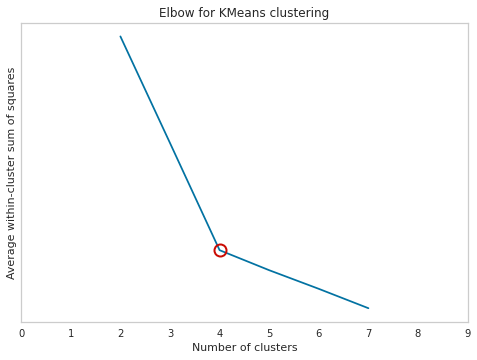

In [ ]:
from sklearn.cluster import KMeans
from scipy.spatial import distance
import numpy.matlib
import matplotlib.pyplot as plt

def elbow_method(data,k):
    clusters = [KMeans(n_clusters = c,init = 'k-means++', random_state=42).fit(matchup_win_df_knn.values) for c in k]
    centr_lst = [cc.cluster_centers_ for cc in clusters]
    k_distance = [distance.cdist(data, cent, 'euclidean') for cent in centr_lst]
    clust_indx = [np.argmin(kd,axis=1) for kd in k_distance]
    distances = [np.min(kd,axis=1) for kd in k_distance]
    avg_within = [np.sum(dist)/data.shape[0] for dist in distances]
    return avg_within

def elbow_point(curve):
    n_points = len(curve)
    all_coord = np.vstack((range(n_points), curve)).T
    np.array([range(n_points), curve])
    first_point = all_coord[0]
    line_vec = all_coord[-1] - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))
    vec_from_first = all_coord - first_point
    scalar_product = np.sum(vec_from_first * np.matlib.repmat(line_vec_norm, n_points, 1), axis=1)
    vec_from_first_parallel = np.outer(scalar_product, line_vec_norm)
    vec_to_line = vec_from_first - vec_from_first_parallel
    dist_to_line = np.sqrt(np.sum(vec_to_line ** 2, axis=1))
    print(dist_to_line)
    idx_best = np.argmax(dist_to_line)
    return idx_best

# n=10
# K = range(1, n)
K = [2,3,4,5,6,7]

sum_square=elbow_method(matchup_win_df_knn,K)
elbow=elbow_point(sum_square)
print("Optimal Cluster Number: ",K[elbow])
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(K, sum_square, 'bx-')
ax.plot(K[elbow], sum_square[elbow], marker='o', markersize=12,markeredgewidth=2, markeredgecolor='r', markerfacecolor='None')
ax.set_xticks(np.arange(0,n,1))
ax.set_yticks(np.arange(0,max(sum_square),0.5))
plt.grid()
plt.xlabel('Number of clusters')
plt.ylabel('Average within-cluster sum of squares')
plt.title('Elbow for KMeans clustering')
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

X=matchup_win_df_knn
se = [] 
sil_scores = []
calinski_score = []
davies_score = []
index = range(2, 8)
for i in index:
    kmeans = KMeans(n_clusters=i, random_state=42)
    labels = kmeans.fit_predict(X)
    se.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(X, labels))
    calinski_score.append(calinski_harabasz_score(X, labels))
    davies_score.append(davies_bouldin_score(X, labels))
 
    print('Intertia at K =', i, ':', kmeans.inertia_)
    print("Silhouette Coefficient: %0.3f" % silhouette_score(X, labels))
    print("Calinski-Harabasz Index: %0.3f" % calinski_harabasz_score(X, labels))
    print("Davies-Bouldin Index: %0.3f" % davies_bouldin_score(X, labels))
    print("---------------------------------------------------------------")

Intertia at K = 2 : 235.80879800259717
Silhouette Coefficient: 0.746
Calinski-Harabasz Index: 267.321
Davies-Bouldin Index: 1.259
---------------------------------------------------------------
Intertia at K = 3 : 212.84416637983264
Silhouette Coefficient: 0.732
Calinski-Harabasz Index: 176.776
Davies-Bouldin Index: 1.945
---------------------------------------------------------------
Intertia at K = 4 : 198.65054292062962
Silhouette Coefficient: 0.706
Calinski-Harabasz Index: 138.802
Davies-Bouldin Index: 2.022
---------------------------------------------------------------
Intertia at K = 5 : 186.8462254548624
Silhouette Coefficient: 0.712
Calinski-Harabasz Index: 118.922
Davies-Bouldin Index: 2.245
---------------------------------------------------------------
Intertia at K = 6 : 178.41148066169777
Silhouette Coefficient: 0.717
Calinski-Harabasz Index: 104.498
Davies-Bouldin Index: 2.052
---------------------------------------------------------------
Intertia at K = 7 : 171.2163609

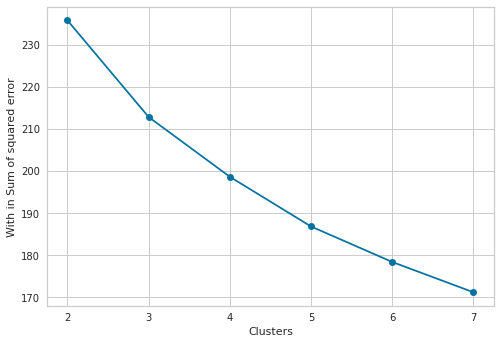

In [ ]:
plt.plot(index, se, marker='o')
plt.xlabel('Clusters')
plt.ylabel('With in Sum of squared error')
plt.show()

In [ ]:
!pip install yellowbrick==1.4

     |████████████████████████████████| 274 kB 3.9 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


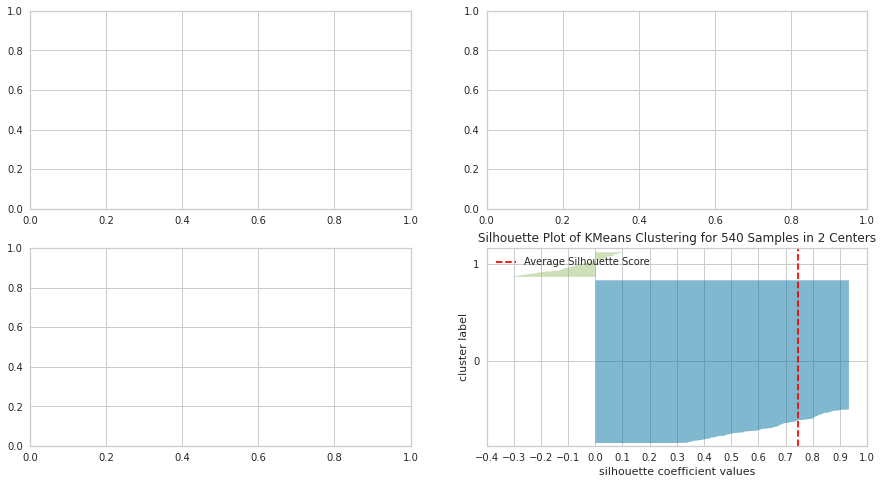

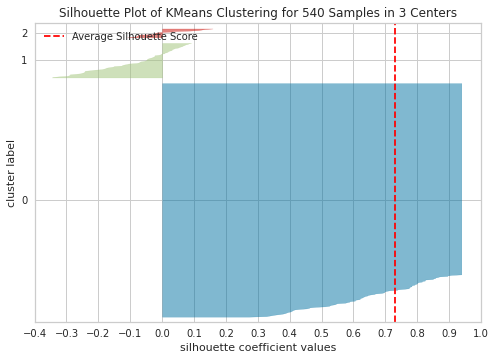

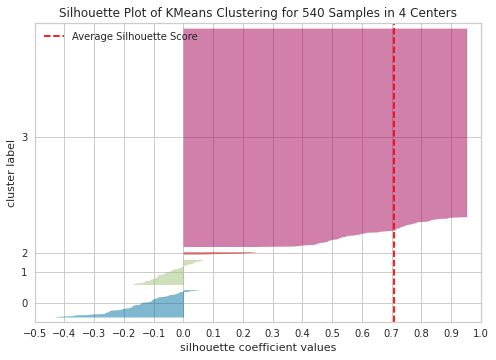

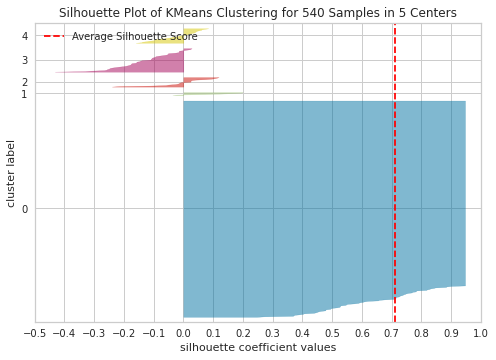

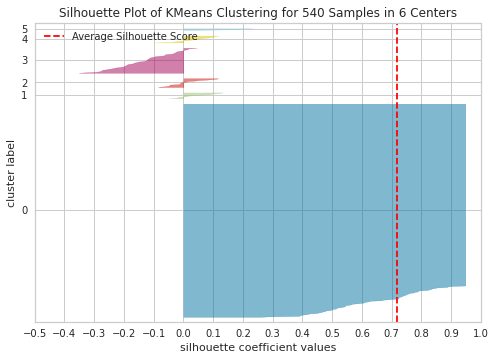

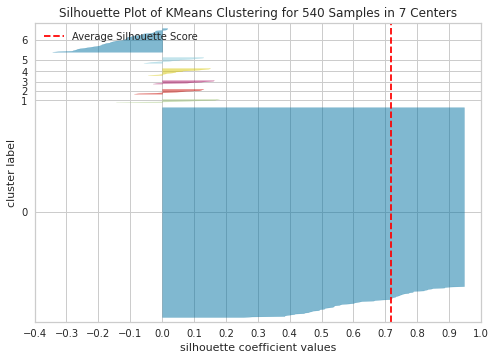

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5, 6, 7]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=42)
    
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick')

    visualizer.fit(X)        # Fit the data to the visualizer
    visualizer.show()

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42)
labels = kmeans.fit_predict(X)
 
print("Silhouette Coefficient: %0.3f" % silhouette_score(X, labels))
print("Calinski-Harabasz Index: %0.3f" % calinski_harabasz_score(X, labels))
print("Davies-Bouldin Index: %0.3f" % davies_bouldin_score(X, labels))

Silhouette Coefficient: 0.706
Calinski-Harabasz Index: 138.802
Davies-Bouldin Index: 2.022


In [ ]:
matchup_lose_df

,ADC_T1_Aatrox,ADC_T1_Ahri,ADC_T1_Akali,ADC_T1_Anivia,ADC_T1_Annie,ADC_T1_Aphelios,ADC_T1_Ashe,ADC_T1_Aurelion Sol,ADC_T1_Azir,ADC_T1_Brand,...,TOP_T2_Warwick,TOP_T2_Wukong,TOP_T2_Xerath,TOP_T2_Yasuo,TOP_T2_Yone,TOP_T2_Yorick,TOP_T2_Zac,TOP_T2_Zed,TOP_T2_Zilean,TOP_T2_Zoe
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ADC_T1_Aatrox,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Akali,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Anivia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Annie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TOP_T2_Yorick,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T2_Zac,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T2_Zed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
matchup_lose_df = matchup_lose_df.filter(regex='T1',axis=0).filter(regex='T1',axis=1)

In [ ]:
matchup_win_df_knn = matchup_win_df.filter(regex='T1',axis=0).filter(regex='T1',axis=1)

In [ ]:
matchup_win_df_knn_1 = matchup_win_df_knn.copy()

In [ ]:
# store the original dataset in 'df', and create the copy of df, df1 = df.copy().
def champion_selection_recommender(champion, num_neighbors, num_recommendation, fill="ANY"):

  number_neighbors = num_neighbors

  knn = NearestNeighbors(metric='cosine', algorithm='brute')
  knn.fit(matchup_win_df_knn.values)
  distances, indices = knn.kneighbors(matchup_win_df_knn.values, n_neighbors=number_neighbors)

  champion_index = matchup_win_df_knn.columns.tolist().index(champion)

  for m,t in list(enumerate(matchup_win_df_knn.index)):
    if matchup_win_df_knn.iloc[m, champion_index] == 0:
      sim_champions = indices[m].tolist()
      champion_distances = distances[m].tolist()
    
      if m in sim_champions:
        id_champion = sim_champions.index(m)
        sim_champions.remove(m)
        champion_distances.pop(id_champion) 

      else:
        sim_champions = sim_champions[:number_neighbors-1]
        champion_distances = champion_distances[:number_neighbors-1]
           
      champion_similarity = [1-x for x in champion_distances]
      champion_similarity_copy = champion_similarity.copy()
      nominator = 0

      for s in range(0, len(champion_similarity)):
        if matchup_win_df_knn.iloc[sim_champions[s], champion_index] == 0:
          if len(champion_similarity_copy) == (number_neighbors - 1):
            champion_similarity_copy.pop(s)
          
          else:
            champion_similarity_copy.pop(s-(len(champion_similarity)-len(champion_similarity_copy)))
            
        else:
          nominator = nominator + champion_similarity[s]*matchup_win_df_knn.iloc[sim_champions[s], champion_index]
          
      if len(champion_similarity_copy) > 0:
        if sum(champion_similarity_copy) > 0:
          predicted_r = nominator/sum(champion_similarity_copy)
        
        else:
          predicted_r = 0

      else:
        predicted_r = 0
        
      matchup_win_df_knn_1.iloc[m,champion_index] = predicted_r

  recommend_champions_list = recommend_champions(champion, num_recommendation, fill)

  return recommend_champions_list

In [ ]:
def recommend_champions(champion, num_recommended_champions, fill):

    recommended_champions = []

    for m in matchup_win_df_knn[matchup_win_df_knn[champion] == 0].index.tolist():

        index_df = matchup_win_df_knn.index.tolist().index(m)
        predicted_rating = matchup_win_df_knn_1.iloc[index_df, matchup_win_df_knn_1.columns.tolist().index(champion)]
        recommended_champions.append((m, predicted_rating))

    sorted_rm = sorted(recommended_champions, key=lambda x:x[1], reverse=True)
    
    # print('Recommended Champion(s): \n')
    rank = 1

    recommend_champions_list = []
    
    if fill == 'ANY':
        for recommended_champion in sorted_rm[:num_recommended_champions]:
            # print('{}: {} - predicted winrate:{}'.format(rank, recommended_champion[0], recommended_champion[1]))
            recommend_champions_list.append(recommended_champion[0])
            rank = rank + 1
    else:
        for recommended_champion in sorted_rm[:]:
            if fill in recommended_champion[0] and rank!= num_recommended_champions:
                # print('{}: {} - predicted winrate:{}'.format(rank, recommended_champion[0], recommended_champion[1]))
                rank = rank + 1
                recommend_champions_list.append(recommended_champion[0])
            elif rank > num_recommended_champions:
                break

    return recommend_champions_list

In [ ]:
champion_selection_recommender("JG_T1_Kha'Zix", 3, 10, "TOP")

Recommended Champion(s): 

1: TOP_T1_Sett - predicted winrate:0.3076923076923077
2: TOP_T1_Gangplank - predicted winrate:0.2763051630464328
3: TOP_T1_Renekton - predicted winrate:0.25
4: TOP_T1_Irelia - predicted winrate:0.23076923076923078
5: TOP_T1_Lucian - predicted winrate:0.23076923076923078
6: TOP_T1_Volibear - predicted winrate:0.23076923076923078
7: TOP_T1_Kennen - predicted winrate:0.20656137422941978
8: TOP_T1_Gragas - predicted winrate:0.2
9: TOP_T1_Sylas - predicted winrate:0.14769332280567918


['TOP_T1_Sett',
 'TOP_T1_Gangplank',
 'TOP_T1_Renekton',
 'TOP_T1_Irelia',
 'TOP_T1_Lucian',
 'TOP_T1_Volibear',
 'TOP_T1_Kennen',
 'TOP_T1_Gragas',
 'TOP_T1_Sylas']

In [ ]:
matchup_win_df

,ADC_T1_Aatrox,ADC_T1_Ahri,ADC_T1_Akali,ADC_T1_Anivia,ADC_T1_Annie,ADC_T1_Aphelios,ADC_T1_Ashe,ADC_T1_Aurelion Sol,ADC_T1_Azir,ADC_T1_Brand,...,TOP_T1_Wukong,TOP_T1_Xerath,TOP_T1_Xin Zhao,TOP_T1_Yasuo,TOP_T1_Yone,TOP_T1_Yorick,TOP_T1_Zac,TOP_T1_Zed,TOP_T1_Zilean,TOP_T1_Zoe
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ADC_T1_Aatrox,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Akali,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Anivia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Annie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TOP_T1_Yorick,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T1_Zac,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T1_Zed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# APRIORI

In [ ]:
rules = pd.read_csv('/work/association_rules.csv', index_col=0)

In [ ]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
6968,"frozenset({'Twitch', 'Lucian'})","frozenset({'Rakan', 'Lillia'})",0.002669,0.005004,0.001001,0.375000,74.941667,9.874243e-04,1.591994
6969,"frozenset({'Rakan', 'Lillia'})","frozenset({'Twitch', 'Lucian'})",0.005004,0.002669,0.001001,0.200000,74.941667,9.874243e-04,1.246664
6996,"frozenset({'Nidalee', 'Tahm Kench'})","frozenset({'Renekton', 'Senna'})",0.002780,0.005782,0.001001,0.360000,62.259231,9.847040e-04,1.553465
6997,"frozenset({'Renekton', 'Senna'})","frozenset({'Nidalee', 'Tahm Kench'})",0.005782,0.002780,0.001001,0.173077,62.259231,9.847040e-04,1.205941
6994,"frozenset({'Renekton', 'Tahm Kench'})","frozenset({'Senna', 'Nidalee'})",0.002002,0.008451,0.001001,0.500000,59.164474,9.838632e-04,1.983098
...,...,...,...,...,...,...,...,...,...
2233,frozenset({'Tahm Kench'}),frozenset({'Miss Fortune'}),0.016235,0.061603,0.001001,0.061644,1.000655,6.553400e-07,1.000043
236,frozenset({'Janna'}),frozenset({'Aphelios'}),0.040921,0.038030,0.001557,0.038043,1.000365,5.687857e-07,1.000014
237,frozenset({'Aphelios'}),frozenset({'Janna'}),0.038030,0.040921,0.001557,0.040936,1.000365,5.687857e-07,1.000016
3358,frozenset({'Alistar'}),"frozenset({'Sylas', 'Ezreal'})",0.067163,0.014900,0.001001,0.014901,1.000012,1.236491e-08,1.000000


In [ ]:
!pip install pycaret

     |████████████████████████████████| 320 kB 33.4 MB/s 
     |████████████████████████████████| 10.4 MB 28.1 MB/s 
     |████████████████████████████████| 261 kB 58.8 MB/s 
     |████████████████████████████████| 636 kB 53.0 MB/s 
     |████████████████████████████████| 2.0 MB 32.1 MB/s 
     |████████████████████████████████| 88 kB 13.9 MB/s 
     |████████████████████████████████| 167 kB 69.4 MB/s 
     |████████████████████████████████| 123 kB 32.3 MB/s 
     |████████████████████████████████| 116 kB 72.1 MB/s 
     |████████████████████████████████| 56 kB 4.6 MB/s 
     |████████████████████████████████| 1.7 MB 43.5 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 16.8 MB 48.4 MB/s 
     |████████████████████████████████| 3.3 MB 55.6 MB/s 
     |████████████████████████████████| 6.8 MB 55.1 MB/s 
     |██████████████

In [ ]:
from pycaret.datasets import get_data
data = get_data('france')

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536370,22728,ALARM CLOCK BAKELIKE PINK,24,12/1/2010 8:45,3.75,12583.0,France
1,536370,22727,ALARM CLOCK BAKELIKE RED,24,12/1/2010 8:45,3.75,12583.0,France
2,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,12/1/2010 8:45,3.75,12583.0,France
3,536370,21724,PANDA AND BUNNIES STICKER SHEET,12,12/1/2010 8:45,0.85,12583.0,France
4,536370,21883,STARS GIFT TAPE,24,12/1/2010 8:45,0.65,12583.0,France


In [ ]:
from pycaret.arules import *
exp_arul101 = setup(data = data, 
                    transaction_id = 'InvoiceNo',
                    item_id = 'Description') 

# Classification model

In [ ]:
predictor_table = master_df[['blue_win','TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']]

In [ ]:
predictor_table

,blue_win,TOP_T1,JG_T1,MID_T1,ADC_T1,SUP_T1,TOP_T2,JG_T2,MID_T2,ADC_T2,SUP_T2
0,1,Riven,Nidalee,Galio,Jhin,Pantheon,Camille,Olaf,Cassiopeia,Ezreal,Alistar
1,0,Teemo,Nidalee,Lucian,Caitlyn,Senna,Irelia,Hecarim,Cassiopeia,Jinx,Lulu
2,0,Malphite,Olaf,Taliyah,Ezreal,Alistar,Sylas,Lillia,Lucian,Senna,Pantheon
3,0,Neeko,Shen,Orianna,Kai'Sa,Nautilus,Riven,Hecarim,Cassiopeia,Samira,Morgana
4,0,Fiora,Nunu & Willump,Irelia,Jhin,Karma,Renekton,Elise,Kled,Jinx,Morgana
...,...,...,...,...,...,...,...,...,...,...,...
8988,0,Sett,Karthus,Twisted Fate,Lucian,Lux,Camille,Nidalee,Fizz,Ashe,Pyke
8989,1,Malzahar,Graves,Akali,Lucian,Thresh,Jayce,Olaf,Yasuo,Kai'Sa,Karthus
8990,0,Irelia,Nidalee,Pantheon,Sivir,Yuumi,Shen,Sylas,Sett,Ezreal,Karma
8991,1,Lulu,Lee Sin,Zed,Ezreal,Lux,Camille,Lillia,Akali,Jhin,Blitzcrank


In [ ]:
X = predictor_table.drop(columns=['blue_win'])

In [ ]:
X.rename(columns = lambda x: x.replace(' ', '_'), inplace=True)

In [ ]:
Y = predictor_table['blue_win']

In [ ]:
X = pd.get_dummies(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [ ]:
clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=10, min_samples_leaf=10)

In [ ]:
clf_blue = clf_entropy.fit(X_train, y_train)

In [ ]:
clf_blue.score(X_test, y_test)

0.7018194070080862

In [ ]:
!pip install graphviz

     |████████████████████████████████| 46 kB 4.1 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


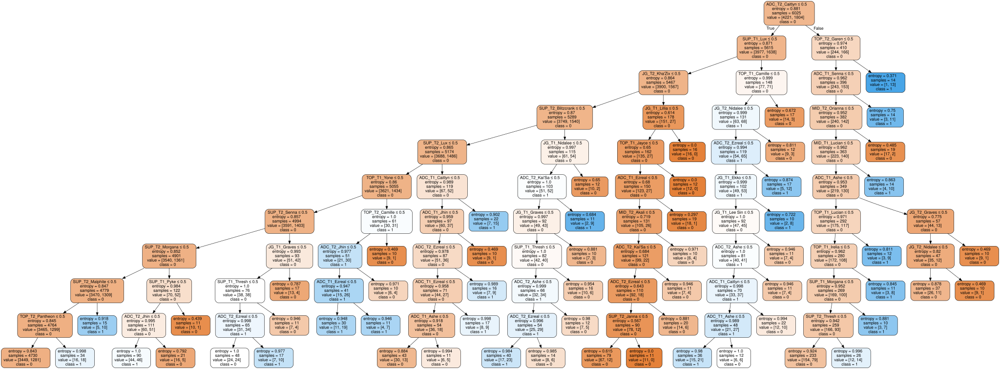

In [ ]:
import graphviz 
from sklearn.tree import export_text
dot_data = export_graphviz(clf_blue, out_file=None, 
                     feature_names=X.columns,  
                     class_names=['0','1'],  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data)  
graph

<AxesSubplot:>

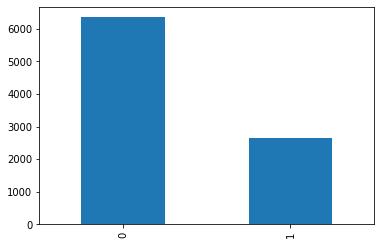

In [ ]:
pd.value_counts(Y).plot.bar()
# bias 0

In [ ]:
clf_gb = GradientBoostingClassifier(min_samples_leaf=50)
clf_gb_blue = clf_gb.fit(X_train, y_train)

In [ ]:
clf_gb_blue.score(X_test, y_test)

0.7196765498652291

In [ ]:
type(X_test.iloc[0])

pandas.core.series.Series

In [ ]:
col = X_train.columns
pred_dict = {}
test = ["ADC_T1_Vayne", "JG_T1_Kha'Zix ", "MID_T1_Yone", "SUP_T1_Blitzcrank", "TOP_T1_Gangplank",
            "ADC_T2_Jhin", "JG_T2_Grave ", "MID_T2_Syndra", "SUP_T2_Braum", "TOP_T2_Kennen"]
for i in col:
    if i in test:
        pred_dict[i] = 1
    else:
        pred_dict[i] = 0

prediction = pd.Series(pred_dict)
prediction = prediction.values.reshape(1,1059)

In [ ]:
clf_blue.predict_proba(prediction)

/shared-libs/python3.7/py/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  "X does not have valid feature names, but"


array([[0.72917548, 0.27082452]])

In [ ]:
prediction.values.reshape(1,1059)

array([[0, 0, 0, ..., 0, 0, 0]])

# Get Best Champion for team

In [ ]:
matchup_win_all_df = matchup_win_df.copy()

In [ ]:
matchup_lose_all_df = matchup_lose_df.copy()

In [ ]:
matchup_win_T1_df = matchup_win_all_df.filter(regex='T1',axis=0).filter(regex='T1',axis=1)
matchup_win_T2_df = matchup_lose_all_df.filter(regex='T2',axis=0).filter(regex='T2',axis=1)

In [ ]:
matchup_lose_T1_df = matchup_win_all_df.filter(regex='T1',axis=0).filter(regex='T2',axis=1)
matchup_lose_T2_df = matchup_lose_all_df.filter(regex='T2',axis=0).filter(regex='T1',axis=1)

In [ ]:
matchup_win_T1_df.head()

,ADC_T1_Aatrox,ADC_T1_Ahri,ADC_T1_Akali,ADC_T1_Anivia,ADC_T1_Annie,ADC_T1_Aphelios,ADC_T1_Ashe,ADC_T1_Aurelion Sol,ADC_T1_Azir,ADC_T1_Brand,...,TOP_T1_Wukong,TOP_T1_Xerath,TOP_T1_Xin Zhao,TOP_T1_Yasuo,TOP_T1_Yone,TOP_T1_Yorick,TOP_T1_Zac,TOP_T1_Zed,TOP_T1_Zilean,TOP_T1_Zoe
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ADC_T1_Aatrox,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Akali,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Anivia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Annie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
matchup_lose_T1_df.head()

,ADC_T2_Akali,ADC_T2_Alistar,ADC_T2_Anivia,ADC_T2_Annie,ADC_T2_Aphelios,ADC_T2_Ashe,ADC_T2_Aurelion Sol,ADC_T2_Azir,ADC_T2_Brand,ADC_T2_Caitlyn,...,TOP_T2_Warwick,TOP_T2_Wukong,TOP_T2_Xerath,TOP_T2_Yasuo,TOP_T2_Yone,TOP_T2_Yorick,TOP_T2_Zac,TOP_T2_Zed,TOP_T2_Zilean,TOP_T2_Zoe
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ADC_T1_Aatrox,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Akali,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Anivia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Annie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(matchup_win_T1_df.shape)
print(matchup_win_T2_df.shape)
print(matchup_lose_T1_df.shape)
print(matchup_lose_T2_df.shape)

(540, 540)
(519, 519)
(540, 519)
(519, 540)


In [ ]:
def find_winrate(champ1,champ2,team):
    if team == 'T1':
        return matchup_win_T1_df.filter(regex=champ1,axis=0)[champ2].values[0]
    else:
        return matchup_win_T2_df.filter(regex=champ1,axis=0)[champ2].values[0]

In [ ]:
def find_counterrate(champ1,champ2,team):
    if team == 'T1':
        return matchup_lose_T1_df.filter(regex=champ1,axis=0)[champ2].values[0]
    else:
        return matchup_lose_T2_df.filter(regex=champ1,axis=0)[champ2].values[0]

In [ ]:
def get_sum_winrate(champ_comb, team):
    result_wr_score = 0
    for i in champ_comb:
        win_rate = find_winrate(i[0],i[1],team)
        result_wr_score += win_rate
    return result_wr_score

In [ ]:
def get_sum_counterrate(champ_comb, team):
    result_cr_score = 0
    for i in champ_comb:
        counter_rate = find_counterrate(i[0],i[1],team)
        result_cr_score += counter_rate
    return result_cr_score

In [ ]:
champ_comb = [('TOP_T1_Riven', 'JG_T1_Nidalee'), ('TOP_T1_Riven', 'MID_T1_Galio'), ('TOP_T1_Riven', 'ADC_T1_Jhin'), ('TOP_T1_Riven', 'SUP_T1_Pantheon'), ('JG_T1_Nidalee', 'MID_T1_Galio'), ('JG_T1_Nidalee', 'ADC_T1_Jhin'), ('JG_T1_Nidalee', 'SUP_T1_Pantheon'), ('MID_T1_Galio', 'ADC_T1_Jhin'), ('MID_T1_Galio', 'SUP_T1_Pantheon'), ('ADC_T1_Jhin', 'SUP_T1_Pantheon')]

get_sum_winrate(champ_comb,'T1')

2.5669041569050375

In [ ]:
champ_comb = [
                ('TOP_T1_Riven', 'JG_T2_Nidalee'), 
                ('TOP_T1_Riven', 'MID_T2_Galio'), 
                ('TOP_T1_Riven', 'ADC_T2_Jhin'), 
                ('TOP_T1_Riven', 'SUP_T2_Pantheon'), 
                ('JG_T1_Nidalee', 'MID_T2_Galio'), 
                ('JG_T1_Nidalee', 'ADC_T2_Jhin'), 
                ('JG_T1_Nidalee', 'SUP_T2_Pantheon'), 
                ('MID_T1_Galio', 'ADC_T2_Jhin'), 
                ('MID_T1_Galio', 'SUP_T2_Pantheon'), 
                ('ADC_T1_Jhin', 'SUP_T2_Pantheon')]

get_sum_counterrate(champ_comb,'T1')

1.898928492086387

In [ ]:
def add_position_to_champ(champ_list,team):
    result = []
    position_team_1 = ['TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1']
    position_team_2 = ['TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']
    if team == 'T1':
        for index,champ in enumerate(champ_list):
            result.append(position_team_1[index]+'_'+champ)
    else:
        for index,champ in enumerate(champ_list):
            result.append(position_team_2[index]+'_'+champ)
    return result

In [ ]:
import itertools

def combination(champs):
    return_list = []
    for L in range(0, len(champs)+1):
        for subset in itertools.combinations(champs, L):
            if len(subset) == 2:
                return_list.append(subset)
    return return_list

In [ ]:
# test comb
champs1 = ['TOP_T1_Riven', 'JG_T1_Nidalee']
champs2 = ['MID_T2_Galio', 'ADC_T2_Jhin']

In [ ]:
def comb_counter(champs1, champs2):
    return_list = list(itertools.product(champs1,champs2))
    return return_list

In [ ]:
comb_counter(champs2,champs1)

[('MID_T2_Galio', 'TOP_T1_Riven'),
 ('MID_T2_Galio', 'JG_T1_Nidalee'),
 ('ADC_T2_Jhin', 'TOP_T1_Riven'),
 ('ADC_T2_Jhin', 'JG_T1_Nidalee')]

In [ ]:
ccc = [
        ('TOP_T1_Darius', 'MID_T2_Akali'), 
        ('TOP_T1_Darius', 'SUP_T2_Thresh'), 
        ('TOP_T1_Darius', 'ADC_T2_Ashe'), 
        ('MID_T1_Irelia', 'MID_T2_Akali'),
        ('MID_T1_Irelia', 'SUP_T2_Thresh'), 
        ('MID_T1_Irelia', 'ADC_T2_Ashe'),
        ('JG_T1_Lee Sin', 'MID_T2_Akali'),
        ('JG_T1_Lee Sin', 'SUP_T2_Thresh'),
        ('JG_T1_Lee Sin', 'ADC_T2_Ashe')]

In [ ]:
get_sum_counterrate(comb_counter(champs1,champs2),'T1')

0.794955044955045

In [ ]:
get_sum_counterrate(comb_counter(champs2,champs1),'T2')

2.205044955044955

In [ ]:
get_sum_counterrate(ccc,'T1')

2.3705033528562938

In [ ]:
new_predictor_table = predictor_table.drop(columns=['blue_win'])
new_predictor_table['blue_team_synergy'] = 0
new_predictor_table['red_team_synergy'] = 0
new_predictor_table['blue_to_red_team_synergy_diff'] = 0

new_predictor_table['blue_team_counter'] = 0
new_predictor_table['red_team_counter'] = 0

for index, row in new_predictor_table.iterrows():

    team1 = row.filter(regex='T1',axis=0)
    team2 = row.filter(regex='T2',axis=0)
    champ_t1 = add_position_to_champ(team1.values, 'T1')
    champ_t2 = add_position_to_champ(team2.values, 'T2')
    champ_comb_t1 = combination(champ_t1)
    champ_comb_t2 = combination(champ_t2)
    champ_counter_comp_t1 = comb_counter(champ_t1, champ_t2)
    champ_counter_comp_t2 = comb_counter(champ_t2, champ_t1)
    synergy_score_t1 = get_sum_winrate(champ_comb_t1,'T1')
    synergy_score_t2 = get_sum_winrate(champ_comb_t2,'T2')
    counter_score_t1 = get_sum_counterrate(champ_counter_comp_t1,'T1')
    counter_score_t2 = get_sum_counterrate(champ_counter_comp_t2,'T2')
    new_predictor_table.loc[index,'blue_team_synergy'] = synergy_score_t1
    new_predictor_table.loc[index,'red_team_synergy'] = synergy_score_t2
    new_predictor_table.loc[index,'blue_to_red_team_synergy_diff'] = new_predictor_table.iloc[index,10] - new_predictor_table.iloc[index,11]
    new_predictor_table.loc[index,'blue_team_counter'] = counter_score_t1
    new_predictor_table.loc[index,'red_team_counter'] = counter_score_t2

In [ ]:
new_predictor_table.to_csv('new_predictor_table.csv')

In [ ]:
new_predictor_table = pd.read_csv('new_predictor_table.csv', index_col=0)

In [ ]:
sum(master_df[master_df['JG_T2'] == 'Olaf']['blue_win'])

51

In [ ]:
matchup_win_all_df

,ADC_T1_Aatrox,ADC_T1_Ahri,ADC_T1_Akali,ADC_T1_Anivia,ADC_T1_Annie,ADC_T1_Aphelios,ADC_T1_Ashe,ADC_T1_Aurelion Sol,ADC_T1_Azir,ADC_T1_Brand,...,TOP_T2_Warwick,TOP_T2_Wukong,TOP_T2_Xerath,TOP_T2_Yasuo,TOP_T2_Yone,TOP_T2_Yorick,TOP_T2_Zac,TOP_T2_Zed,TOP_T2_Zilean,TOP_T2_Zoe
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
ADC_T1_Aatrox,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Ahri,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Akali,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Anivia,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ADC_T1_Annie,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TOP_T2_Yorick,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T2_Zac,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TOP_T2_Zed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
new_predictor_table

,TOP_T1,JG_T1,MID_T1,ADC_T1,SUP_T1,TOP_T2,JG_T2,MID_T2,ADC_T2,SUP_T2,blue_team_synergy,red_team_synergy,blue_to_red_team_synergy_diff,blue_team_counter,red_team_counter
0,Riven,Nidalee,Galio,Jhin,Pantheon,Camille,Olaf,Cassiopeia,Ezreal,Alistar,2.566904,6.097897,-3.530992,4.871066,15.128934
1,Teemo,Nidalee,Lucian,Caitlyn,Senna,Irelia,Hecarim,Cassiopeia,Jinx,Lulu,1.293417,2.651786,-1.358368,4.282645,8.717355
2,Malphite,Olaf,Taliyah,Ezreal,Alistar,Sylas,Lillia,Lucian,Senna,Pantheon,1.307137,7.814877,-6.507740,4.345718,11.654282
3,Neeko,Shen,Orianna,Kai'Sa,Nautilus,Riven,Hecarim,Cassiopeia,Samira,Morgana,0.671248,2.398810,-1.727561,2.678466,10.321534
4,Fiora,Nunu & Willump,Irelia,Jhin,Karma,Renekton,Elise,Kled,Jinx,Morgana,1.668511,2.155594,-0.487084,2.723697,5.276303
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8988,Sett,Karthus,Twisted Fate,Lucian,Lux,Camille,Nidalee,Fizz,Ashe,Pyke,1.178388,5.328987,-4.150599,5.298355,13.701645
8989,Malzahar,Graves,Akali,Lucian,Thresh,Jayce,Olaf,Yasuo,Kai'Sa,Karthus,1.958119,2.078936,-0.120817,4.374708,10.625292
8990,Irelia,Nidalee,Pantheon,Sivir,Yuumi,Shen,Sylas,Sett,Ezreal,Karma,0.952448,3.316937,-2.364490,2.695873,6.304127
8991,Lulu,Lee Sin,Zed,Ezreal,Lux,Camille,Lillia,Akali,Jhin,Blitzcrank,2.643592,5.647333,-3.003741,8.324404,15.675596


In [ ]:
predictor_df = new_predictor_table.copy()

In [ ]:
predictor_df['blue_win'] = predictor_table['blue_win']

In [ ]:
class_2,class_1 = predictor_df.blue_win.value_counts()

In [ ]:
c2 = predictor_df[predictor_df['blue_win'] == 0]
c1 = predictor_df[predictor_df['blue_win'] == 1]
df_2 = c2.sample(class_1)

In [ ]:
undersampled_df = pd.concat([df_2,c1],axis=0).reset_index(drop=True)

In [ ]:
X = undersampled_df.drop(columns=['blue_win'])

In [ ]:
heroes_T1_win = master_df['TOP_T1'].copy()

In [ ]:
for val in master_df.drop(columns=['blue_win','TOP_T1']).columns:
  heroes_T1_win = heroes_T1_win.append(master_df[val], ignore_index=True)

In [ ]:
heroes_name = heroes_T1_win.unique()

In [ ]:
all_columns_name = []
for col in ['TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']:
  for name in heroes_name:
    all_columns_name.append(col+'_'+name)

In [ ]:
X_dummy = pd.DataFrame(index=X.index ,columns=all_columns_name) 
X_dummy.head()

,TOP_T1_Riven,TOP_T1_Teemo,TOP_T1_Malphite,TOP_T1_Neeko,TOP_T1_Fiora,TOP_T1_Irelia,TOP_T1_Galio,TOP_T1_Poppy,TOP_T1_Shen,TOP_T1_Ornn,...,SUP_T2_Varus,SUP_T2_Zyra,SUP_T2_VelKoz,SUP_T2_Caitlyn,SUP_T2_Sivir,SUP_T2_Xayah,SUP_T2_Blitzcrank,SUP_T2_Nami,SUP_T2_Braum,SUP_T2_Rell
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
X_dummy.fillna(0, inplace = True)

In [ ]:
undersampled_df.columns

Index(['TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2',
       'MID_T2', 'ADC_T2', 'SUP_T2', 'blue_team_synergy', 'red_team_synergy',
       'blue_to_red_team_synergy_diff', 'blue_team_counter',
       'red_team_counter', 'blue_win'],
      dtype='object')

In [ ]:
X_dummy['blue_team_synergy'] = undersampled_df['blue_team_synergy']
X_dummy['red_team_synergy'] = undersampled_df['red_team_synergy']
X_dummy['blue_to_red_team_synergy_diff'] = undersampled_df['blue_to_red_team_synergy_diff']
X_dummy['blue_team_counter'] = undersampled_df['blue_team_counter']
X_dummy['red_team_counter'] = undersampled_df['red_team_counter']

In [ ]:
for col in ['TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2', 'MID_T2', 'ADC_T2', 'SUP_T2']:
  for idx, name in enumerate(X.loc[:,col]):
    X_dummy.loc[idx,col+'_'+name] = 1    

In [ ]:
Y = undersampled_df['blue_win'].reset_index(drop=True)

In [ ]:
X = X_dummy.copy()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.33, random_state=42)

In [ ]:
clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100, max_depth=10, min_samples_leaf=10)

In [ ]:
clf_blue = clf_entropy.fit(X_train, y_train)

In [ ]:
clf_blue.score(X_test, y_test)

0.6509758897818599

In [ ]:
!pip install graphviz

     |████████████████████████████████| 46 kB 2.1 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import graphviz 
from sklearn.tree import export_text
dot_data = export_graphviz(clf_blue, out_file=None, 
                     feature_names=X.columns,  
                     class_names=['0','1'],  
                     filled=True, rounded=True,  
                     special_characters=True)  
graph = graphviz.Source(dot_data)  

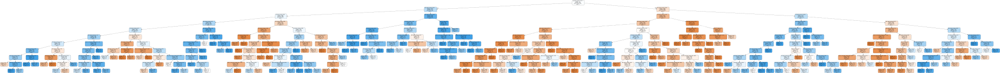

In [ ]:
graph

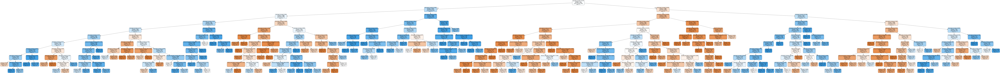

In [ ]:
png_bytes = graph.pipe(format='png')
with open('dtree_pipe.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

In [ ]:
X_train.head()

,TOP_T1_Riven,TOP_T1_Teemo,TOP_T1_Malphite,TOP_T1_Neeko,TOP_T1_Fiora,TOP_T1_Irelia,TOP_T1_Galio,TOP_T1_Poppy,TOP_T1_Shen,TOP_T1_Ornn,...,SUP_T2_Xayah,SUP_T2_Blitzcrank,SUP_T2_Nami,SUP_T2_Braum,SUP_T2_Rell,blue_team_synergy,red_team_synergy,blue_to_red_team_synergy_diff,blue_team_counter,red_team_counter
1264,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1.298869,1.760058,-0.461189,3.954342,12.045658
990,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2.580303,0.932836,1.647467,3.062920,10.937080
2897,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2.140588,2.360406,-0.219818,5.789723,18.210277
1614,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,2.258628,2.450034,-0.191407,4.710457,15.289543
3784,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1.781597,1.774887,0.006710,5.821375,14.178625


In [ ]:
y_pred = clf_blue.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.66      0.65      0.65       883
           1       0.64      0.65      0.65       859

    accuracy                           0.65      1742
   macro avg       0.65      0.65      0.65      1742
weighted avg       0.65      0.65      0.65      1742



In [ ]:
clf_gb = GradientBoostingClassifier(min_samples_leaf=50)
clf_gb_blue = clf_gb.fit(X_train, y_train)

In [ ]:
clf_gb_blue.score(X_test, y_test)

0.7233065442020666

In [ ]:
y_pred = clf_gb_blue.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.73      0.73      0.73       883
           1       0.72      0.72      0.72       859

    accuracy                           0.72      1742
   macro avg       0.72      0.72      0.72      1742
weighted avg       0.72      0.72      0.72      1742



In [ ]:
import pickle
filename = 'clf_gb_blue.sav'
pickle.dump(clf_gb_blue, open(filename, 'wb'))

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
feature_importance = clf_gb_blue.feature_importances_


In [ ]:
feature_importance

array([0.        , 0.        , 0.        , ..., 0.01320685, 0.37904592,
       0.41449215])

In [ ]:
for feat, importance in zip(X_train.columns, clf_gb_blue.feature_importances_):
    print('feature: {f}, importance: {i}'.format(f=feat, i=importance))

feature: TOP_T1_Riven, importance: 0.0
feature: TOP_T1_Teemo, importance: 0.0
feature: TOP_T1_Malphite, importance: 0.0
feature: TOP_T1_Neeko, importance: 0.0
feature: TOP_T1_Fiora, importance: 0.0
feature: TOP_T1_Irelia, importance: 0.0
feature: TOP_T1_Galio, importance: 0.0
feature: TOP_T1_Poppy, importance: 0.0
feature: TOP_T1_Shen, importance: 0.0018798930856020945
feature: TOP_T1_Ornn, importance: 0.0
feature: TOP_T1_Tryndamere, importance: 0.0
feature: TOP_T1_Qiyana, importance: 0.0
feature: TOP_T1_Jax, importance: 0.0005493180044251297
feature: TOP_T1_Lucian, importance: 0.0
feature: TOP_T1_Jayce, importance: 0.0
feature: TOP_T1_Vladimir, importance: 0.0
feature: TOP_T1_Renekton, importance: 0.00034455476987461676
feature: TOP_T1_Urgot, importance: 0.0
feature: TOP_T1_Camille, importance: 0.0
feature: TOP_T1_Sett, importance: 0.0
feature: TOP_T1_Maokai, importance: 0.0
feature: TOP_T1_Sylas, importance: 0.0
feature: TOP_T1_Rengar, importance: 0.0
feature: TOP_T1_Gragas, importan

In [ ]:
def get_best_counter_synergy_champ(current_champ_list,potential_champ_list,opponent_champ_list, top_best):

    counter_score_list = []
    synergy_score_list = []
    champ_recommended_score = {}

    for champ in potential_champ_list:
        temp = current_champ_list.copy()
        temp.append(champ)
        champ_counter_comp_t1 = comb_counter(temp, opponent_champ_list)
        champ_comb_t1 = combination(temp)
        counter_score_temp = get_sum_counterrate(champ_counter_comp_t1,'T1')
        counter_score_list.append(counter_score_temp)

        synergy_score_temp = get_sum_winrate(champ_comb_t1,'T1')
        synergy_score_list.append(synergy_score_temp)

    for i in range(len(synergy_score_list)):
        champ_recommended_score[potential_champ_list[i]] = (0.7*counter_score_list[i])+(0.3*synergy_score_list[i])

    sorted_score = {k: v for k, v in sorted(champ_recommended_score.items(), key=lambda item: item[1], reverse=True)}

    rank = 1
    print("\nBest champion to pick: \n")
    for k, v in sorted_score.items():
        print("{}: {} - {}".format(rank,k, v))
        rank += 1
        if rank > top_best:
            break

In [ ]:
def get_score_for_pred(prediction_champ, pred_list):

    prediction_champ['blue_team_synergy'] = 0
    prediction_champ['red_team_synergy'] = 0
    prediction_champ['blue_to_red_team_synergy_diff'] = 0

    prediction_champ['blue_team_counter'] = 0
    prediction_champ['red_team_counter'] = 0

    team1 = [champ for champ in pred_list if 'T1' in champ]
    team2 = [champ for champ in pred_list if 'T2' in champ]
   
    champ_comb_t1 = combination(team1)
    champ_comb_t2 = combination(team2)
    champ_counter_comp_t1 = comb_counter(team1, team2)
    champ_counter_comp_t2 = comb_counter(team2, team1)
    synergy_score_t1 = get_sum_winrate(champ_comb_t1,'T1')
    synergy_score_t2 = get_sum_winrate(champ_comb_t2,'T2')
    counter_score_t1 = get_sum_counterrate(champ_counter_comp_t1,'T1')
    counter_score_t2 = get_sum_counterrate(champ_counter_comp_t2,'T2')

    prediction_champ['blue_team_synergy'] = synergy_score_t1
    prediction_champ['red_team_synergy'] = synergy_score_t2
    prediction_champ['blue_to_red_team_synergy_diff'] = prediction_champ['blue_team_synergy'] - prediction_champ['red_team_synergy']
    prediction_champ['blue_team_counter'] = counter_score_t1
    prediction_champ['red_team_counter'] = counter_score_t2

    return prediction_champ

In [ ]:
current_champ_list = ["JG_T1_Graves",'MID_T1_Ahri','ADC_T1_Caitlyn','TOP_T1_Volibear','SUP_T1_Lux']

pro_team_champ_list = ["ADC_T1_Ashe","SUP_T1_Pantheon","MID_T1_Orianna",'TOP_T1_Ornn','JG_T1_Graves']
# pro_team_champ_list = ["ADC_T1_Ezreal","SUP_T1_Alistar","MID_T1_Akali",'TOP_T1_Jax','JG_T1_Nidalee']
# pro_team_champ_list = ["ADC_T1_Aphelios","SUP_T1_Thresh","MID_T1_Lucian",'TOP_T1_Ornn','JG_T1_Evelynn']

opponent_champ_list = ['ADC_T2_Ezreal','SUP_T2_Leona','MID_T2_Azir','JG_T2_Shen','TOP_T2_Wukong']
# opponent_champ_list = ['ADC_T2_Ezreal','SUP_T2_Leona','MID_T2_Azir','JG_T2_Shen','TOP_T2_Wukong']
# opponent_champ_list = ['ADC_T2_Jhin','MID_T2_Syndra','JG_T2_Graves','TOP_T2_Kennen','SUP_T2_Braum']
# opponent_champ_list = ['ADC_T2_Jhin','MID_T2_Syndra','SUP_T2_Leona','JG_T2_Rengar','TOP_T2_Fiora']

all_potential_champ_list = []
for i in current_champ_list:
    potential_champ_list = champion_selection_recommender(i, 3, 10, "ANY")
    all_potential_champ_list.extend(potential_champ_list)
all_potential_champ_list = list(set(all_potential_champ_list))
get_best_counter_synergy_champ(current_champ_list,all_potential_champ_list,opponent_champ_list,20)


Best champion to pick: 

1: MID_T1_Zed - 5.109599164617901
2: ADC_T1_Caitlyn - 4.971400062011127
3: SUP_T1_Lux - 4.884293158167614
4: ADC_T1_Ashe - 4.882893285111284
5: ADC_T1_Miss Fortune - 4.779701057364506
6: SUP_T1_Thresh - 4.690366675274483
7: SUP_T1_Sett - 4.653412693320086
8: JG_T1_Kha'Zix - 4.648676374644373
9: MID_T1_Galio - 4.598373042630083
10: JG_T1_Olaf - 4.57606417203217
11: JG_T1_Lee Sin - 4.570423291173899
12: MID_T1_Yone - 4.565976379236398
13: TOP_T1_Jayce - 4.545701012845482
14: SUP_T1_Blitzcrank - 4.544551566990153
15: TOP_T1_Volibear - 4.543672961733984
16: JG_T1_Karthus - 4.538677022145021
17: TOP_T1_Fiora - 4.497465687183685
18: SUP_T1_Taric - 4.48736977464212
19: MID_T1_Lucian - 4.468735619786531
20: SUP_T1_Pantheon - 4.429802222692418


In [ ]:
#current_champ_list = ["MID_T1_Akali","ADC_T1_Draven","SUP_T1_Pantheon","TOP_T1_Darius","JG_T1_Hecarim"]
#current_champ_list = ["MID_T1_Orianna","ADC_T1_Aphelios","SUP_T1_Alistar","TOP_T1_Renekton","JG_T1_Nidalee"]

opponent_champ_list = ['ADC_T2_Jhin','MID_T2_Syndra','JG_T2_Graves','TOP_T2_Kennen','SUP_T2_Braum']


In [ ]:
with open('columns_all.pkl', 'wb') as f:
    pickle.dump(list(X_train.columns), f)

In [ ]:
X_train.columns

Index(['TOP_T1_Riven', 'TOP_T1_Teemo', 'TOP_T1_Malphite', 'TOP_T1_Neeko',
       'TOP_T1_Fiora', 'TOP_T1_Irelia', 'TOP_T1_Galio', 'TOP_T1_Poppy',
       'TOP_T1_Shen', 'TOP_T1_Ornn',
       ...
       'SUP_T2_Xayah', 'SUP_T2_Blitzcrank', 'SUP_T2_Nami', 'SUP_T2_Braum',
       'SUP_T2_Rell', 'blue_team_synergy', 'red_team_synergy',
       'blue_to_red_team_synergy_diff', 'blue_team_counter',
       'red_team_counter'],
      dtype='object', length=1545)

In [ ]:
with open('./columns_all.pkl', 'rb') as f:
    col = pickle.load(f)

In [ ]:
len(col)

1545

In [ ]:
pred_list = current_champ_list+opponent_champ_list
# pred_list = pro_team_champ_list+opponent_champ_list

predictor_table = master_df[['blue_win','TOP_T1', 'JG_T1', 'MID_T1', 'ADC_T1', 'SUP_T1', 'TOP_T2', 'JG_T2','MID_T2', 'ADC_T2', 'SUP_T2']]
# X = predictor_table.drop(columns=['blue_win'])
# X.rename(columns = lambda x: x.replace(' ', '_'), inplace=True)
# X = pd.get_dummies(X)

col = X_train.columns
pred_dict = {}

# test = ["ADC_T1_Vayne", "JG_T1_Kha'Zix ", "MID_T1_Yone", "SUP_T1_Blitzcrank", "TOP_T1_Gangplank",
#             "ADC_T2_Jhin", "JG_T2_Grave ", "MID_T2_Syndra", "SUP_T2_Braum", "TOP_T2_Kennen"]

for i in col:
    if i in pred_list:
        pred_dict[i] = 1
    else:
        pred_dict[i] = 0

prediction = pd.Series(pred_dict)
prediction = get_score_for_pred(prediction, pred_list)

# prediction['blue_team_synergy'] = undersampled_df['blue_team_synergy']
# prediction['red_team_synergy'] = undersampled_df['red_team_synergy']
# prediction['blue_to_red_team_synergy_diff'] = undersampled_df['blue_to_red_team_synergy_diff']
# prediction['blue_team_counter'] = undersampled_df['blue_team_counter']
# prediction['red_team_counter'] = undersampled_df['red_team_counter']

prediction = prediction.values.reshape(1,1545)

In [ ]:
prediction

array([[0, 0, 0, ..., 0, 4, 6]])

In [ ]:
clf_gb_blue.predict_proba(prediction)

/shared-libs/python3.7/py/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  "X does not have valid feature names, but"


array([[0.13976057, 0.86023943]])

In [ ]:
ccc = [('TOP_T1_Darius', 'MID_T2_Akali'), ('TOP_T1_Darius', 'SUP_T2_Thresh'), ('TOP_T1_Darius', 'ADC_T2_Ashe'), ('MID_T1_Irelia', 'MID_T2_Akali'), ('MID_T1_Irelia', 'SUP_T2_Thresh'), ('MID_T1_Irelia', 'ADC_T2_Ashe'), ('JG_T1_Leesin', 'MID_T2_Akali'), ('JG_T1_Lee Sin', 'SUP_T2_Thresh'), ('JG_T1_Leesin', 'ADC_T2_Ashe')]

In [ ]:
get_sum_counterrate(champ_counter_comp_t1,'T1')

4.4355113588053525

In [ ]:
!pip install dash

     |████████████████████████████████| 9.6 MB 9.4 MB/s 
     |████████████████████████████████| 95 kB 4.1 MB/s 
     |████████████████████████████████| 357 kB 15.8 MB/s 
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
!pip install dash_table
!pip install dash_html_components
!pip install colorlover
!pip install jupyter_dash

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=f203e3a727d0a841ce278dc505bb05bebec39b2abb2a7db270f7644b5d1e2a77
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import dash
import dash_table
import pandas as pd
import dash_html_components as html
import colorlover
from jupyter_dash import JupyterDash

def discrete_background_color_bins(df, n_bins=7, columns='all'):

 bounds = [i * (1.0 / n_bins) for i in range(n_bins+1)]
 if columns == 'all':
     if 'id' in df:
         df_numeric_columns = df.select_dtypes('number').drop(['id'], axis=1)
     else:
         df_numeric_columns = df.select_dtypes('number')
 else:
     df_numeric_columns = df[columns]
 df_max = df_numeric_columns.max().max()
 df_min = df_numeric_columns.min().min()
 ranges = [
     ((df_max - df_min) * i) + df_min
     for i in bounds
 ]
 styles = []
 legend = []
 for i in range(1, len(bounds)):
     min_bound = ranges[i - 1]
     max_bound = ranges[i]
     backgroundColor = colorlover.scales[str(n_bins+4)]['div']['RdYlGn'][2:-2][i - 1]
     color = 'black'

     for column in df_numeric_columns:
         styles.append({
             'if': {
                 'filter_query': (
                     '{{{column}}} >= {min_bound}' +
                     (' && {{{column}}} < {max_bound}' if (i < len(bounds) - 1) else '')
                 ).format(column=column, min_bound=min_bound, max_bound=max_bound),
                 'column_id': column
             },
             'backgroundColor': backgroundColor,
             'color': color
         })
     legend.append(
         html.Div(style={'display': 'inline-block', 'width': '60px'}, children=[
             html.Div(
                 style={
                     'backgroundColor': backgroundColor,
                     'borderLeft': '1px rgb(50, 50, 50) solid',
                     'height': '10px'
                 }
             ),
             html.Small(round(min_bound, 2), style={'paddingLeft': '2px'})
         ])
     )

 return (styles, html.Div(legend, style={'padding': '5px 0 5px 0'}))
 
# Dash Application
df = pd.DataFrame(list(zip(
    [2,3,4,5,6,7],
    [235.808, 212.844, 198.650, 186.846, 178.411,171.216],
    [0.746, 0.732, 0.706, 0.712, 0.712, 0.719],
    [267.321, 176.776, 138.802, 118.922, 104.498, 94.304],
    [1.259, 1.945, 2.022, 2.245, 2.052, 1.995]
)), columns=['K (No. of Clusters)', 'Within Sum of Square Error', 'Silhouette Score', 'Calinski Harabaz Index', 'Davies Bouldin Index'])

app = JupyterDash(__name__)

# Function for styling table, defined below
cols = ['Within Sum of Square Error', 'Silhouette Score', 'Calinski Harabaz Index', 'Davies Bouldin Index']
(styles, legend) = discrete_background_color_bins(df, columns = cols)

app.layout = html.Div([
    legend,
    dash_table.DataTable(
        id = 'table',
        columns = [{"name": i, "id": i} for i in df.columns],
        data = df.to_dict('records'),
        style_data_conditional = styles
    )
])

app.run_server(mode='inline')

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=790f9840-fdad-4b7a-aee8-9a9b857d1e82' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>